##  Multi-Head Attention (Self-Attention)

- **Self-Attention**
  - Each token attends to every other token in the sequence.
  - Captures contextual relationships.

- **Self-Attention without Masking**
  - Tokens can freely attend to all positions.
  - Common in encoder layers (e.g., BERT).

- **Self-Attention with Masking**
  - Prevents tokens from attending to future positions.
  - Ensures autoregressive property in decoders (e.g., GPT).


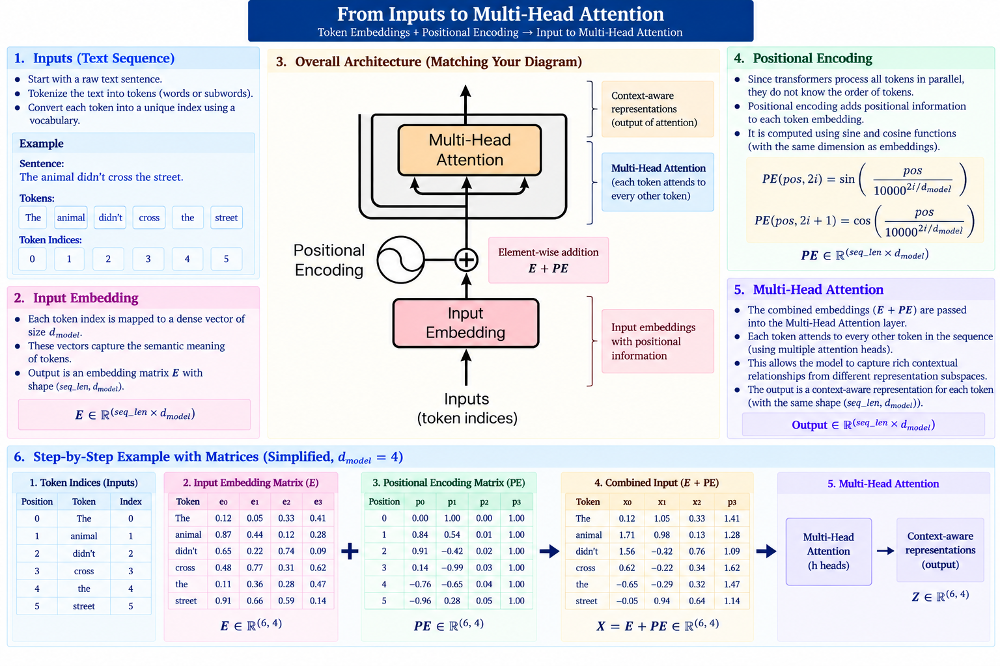

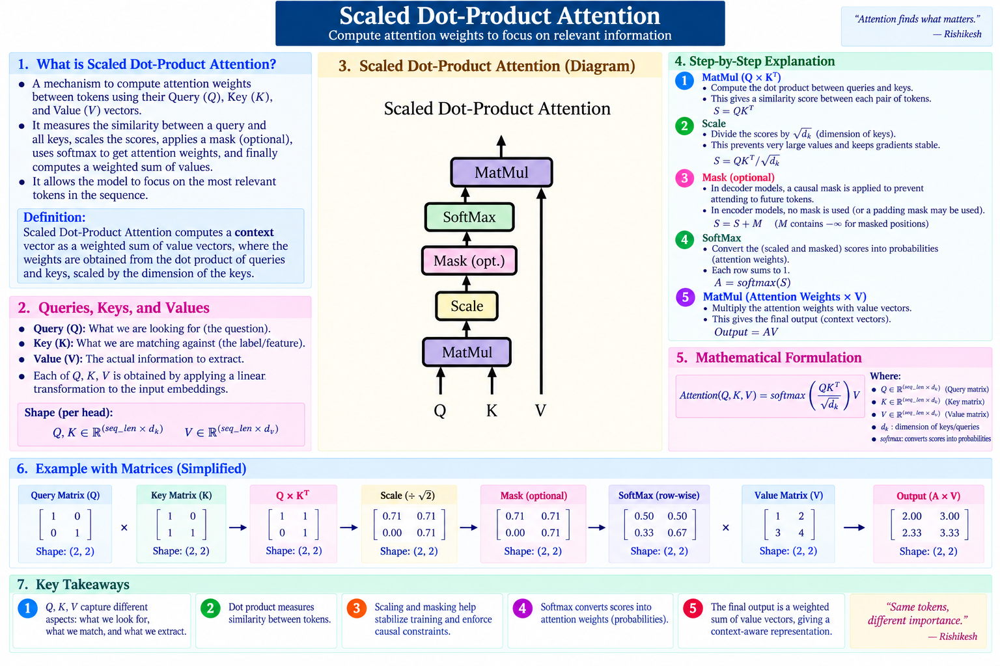

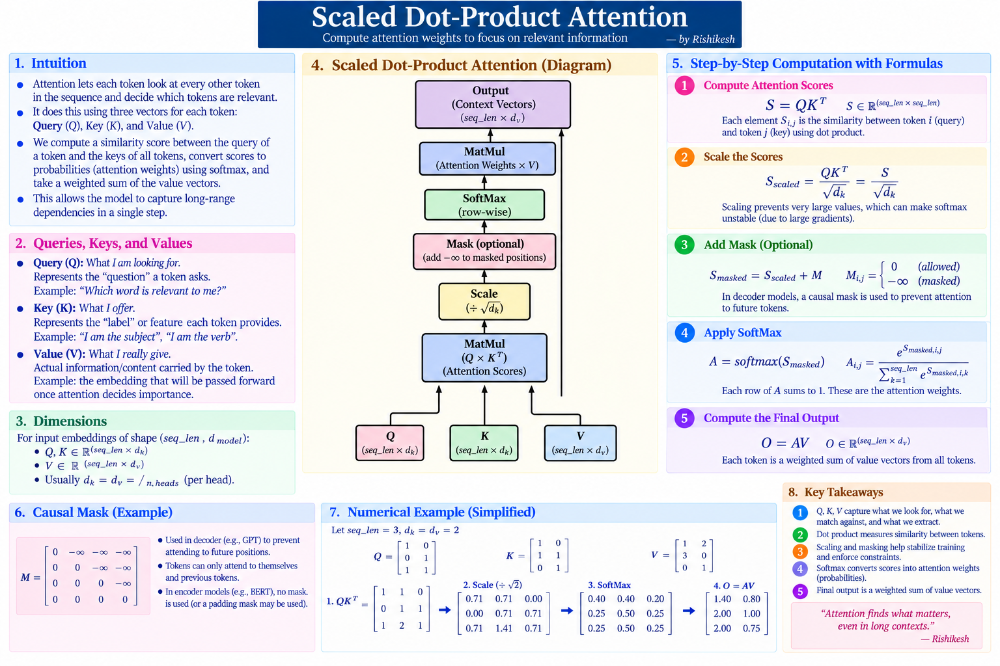

In [ ]:
import numpy as np
import math


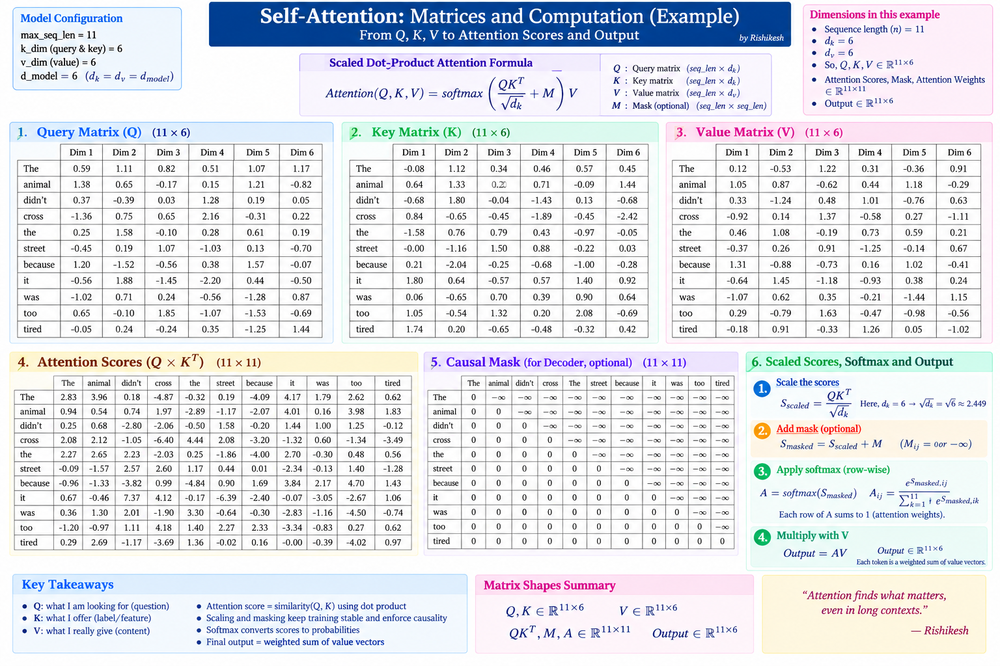

In [ ]:
max_seq_len=11
d_key=6
d_query=6
d_value=6

In [ ]:
q=np.random.randn(max_seq_len,d_query)##query
k=np.random.randn(max_seq_len,d_key)##key
v=np.random.randn(max_seq_len,d_value)##value

In [ ]:
q

array([[ 8.59879811e-01,  1.10219840e-01, -5.34018515e-01,
        -2.37287320e-01,  1.84519070e+00, -3.99302033e-01],
       [ 3.60923129e-02, -6.44969165e-01, -1.28659946e+00,
         1.42394594e+00, -3.31277940e-01, -7.04396593e-02],
       [-1.97385058e+00, -1.06127201e+00, -2.09294711e-01,
         1.39700515e+00, -1.43072842e+00,  1.20132267e+00],
       [ 3.25727949e-01, -1.65897993e-02,  4.31211625e-01,
        -1.91489188e+00, -1.01177251e+00, -1.30652341e+00],
       [-1.38331055e+00, -2.43157574e+00, -1.02998291e+00,
        -3.22610055e-01,  1.10293478e-01, -1.50840114e+00],
       [-2.58294503e-01,  2.32630697e-03,  3.42994552e-01,
        -1.31866798e+00, -5.10117076e-01,  2.78542534e-01],
       [ 1.65679784e+00,  6.82596464e-01, -6.01392126e-01,
         2.29252947e+00,  9.08821917e-01,  3.05436580e+00],
       [-1.84370488e+00, -8.58004987e-01,  3.05540582e-01,
         2.85599623e-01,  4.01109553e-01, -6.10075248e-01],
       [-3.34392690e-01,  1.15947790e+00, -1.362

In [ ]:
k

array([[-0.37677151,  1.12254546, -1.99082262, -0.91061296,  0.75393804,
        -0.0394568 ],
       [ 0.47248243,  0.13103976,  0.56696237,  0.16016037,  0.39400809,
        -0.43779938],
       [ 0.04358937, -1.11156872,  0.16296416,  0.31219933, -0.27397824,
         0.1158749 ],
       [-0.77649507, -0.81024498,  0.40639861, -0.68591184,  0.52052599,
         1.08711429],
       [ 0.2661059 ,  0.28625793, -0.47005094, -0.30164374,  1.01187492,
         0.80568298],
       [-1.06577825,  0.47723998,  1.24127183, -0.1571994 ,  0.58922992,
         0.30547928],
       [ 0.72437149,  1.46182489,  0.41246367, -0.24171909, -0.78729759,
        -1.39839994],
       [ 0.37238455,  0.50843012, -0.60534114,  0.86853366, -1.85186838,
         0.23560803],
       [ 1.89012005, -0.51612737, -0.35095912, -1.51730358, -0.72346979,
         0.90913621],
       [-1.97476028,  0.98455651,  1.00426152, -0.08067924,  0.66530808,
         2.17422023],
       [-0.25685167, -1.62740379, -1.21735841, -0.

In [ ]:
v

array([[-0.471411  , -0.24062049,  2.71596978,  0.56525702,  1.05567153,
         0.96179702],
       [-2.84883592,  0.77065657, -1.60079545, -0.18234181, -0.64443499,
         0.03429687],
       [ 1.70539821,  0.76899147,  0.19379936,  0.36294611, -0.03918355,
        -0.37278679],
       [ 1.64019277,  0.75718503,  0.29584496,  0.45738756, -0.50662956,
         1.46960492],
       [-0.579011  , -2.63229863,  0.5985658 ,  0.22695378, -0.82529211,
        -0.34801537],
       [-0.64128999,  0.39037017,  1.60774258, -0.04540486,  0.38475674,
        -0.66691645],
       [ 0.59623941, -2.52585854, -0.87402928, -0.02367561, -0.7095353 ,
        -0.32505581],
       [ 0.22414432,  0.01002516,  0.19818556, -0.28280715,  1.03088276,
        -0.46320401],
       [ 1.41631683,  0.14951008,  0.34514782, -0.19693529, -0.9359856 ,
        -2.89839395],
       [ 0.26793839, -1.10489931,  0.80144159, -1.27629297,  0.30627976,
         0.23556331],
       [ 0.40520099, -0.65597044, -0.60545258,  0.

## **Self-Attention**


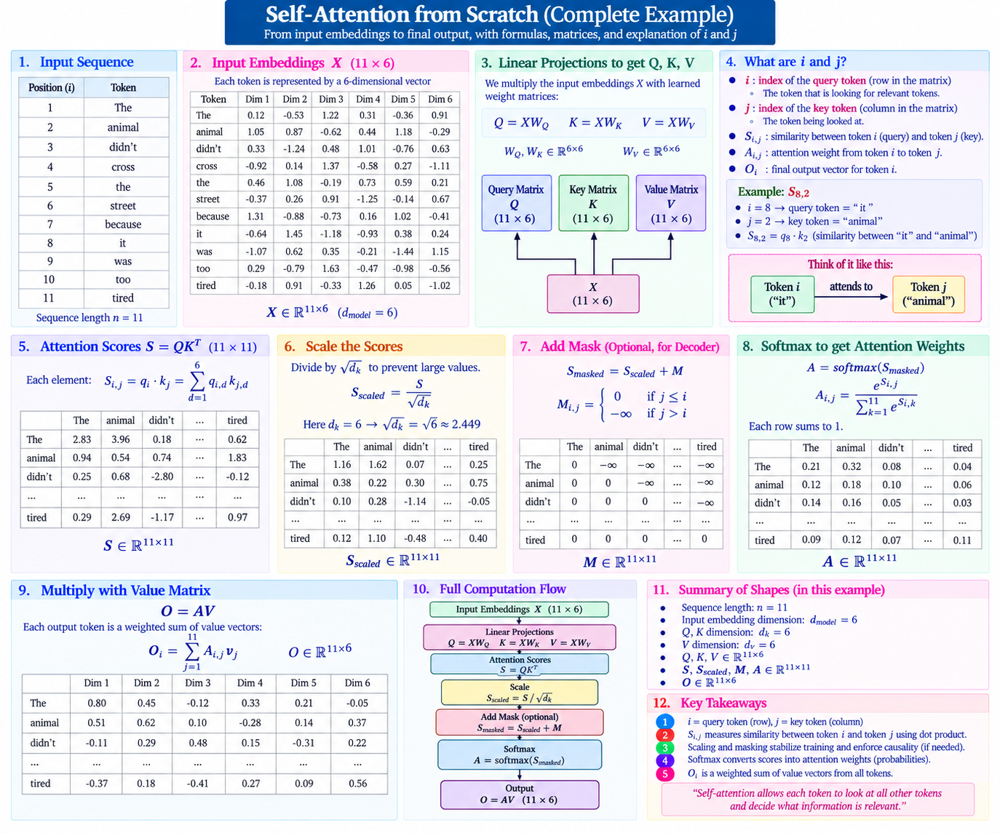

In [ ]:
q.shape,k.shape

((11, 6), (11, 6))

In [ ]:
K=k.T
K.shape

(6, 11)

In [ ]:
#Matmul(Attention)
S=np.matmul(q,K)
S

array([[ 2.48587626,  0.98178311, -0.79795332, -0.28488093,  2.12835388,
        -0.52413753, -0.27324209, -3.01771268,  0.4178845 , -1.74723919,
        -3.54730634],
       [ 0.2801382 , -0.66854514,  1.03598692, -1.25403083, -0.39174413,
        -2.38385133, -1.43224105,  2.29798203, -1.13227909, -2.4868007 ,
         2.3238799 ],
       [-2.42917871, -2.05625281,  2.026866  ,  1.91053982, -1.63190248,
         0.64175677, -3.95872471,  2.99798858, -3.10203534,  4.19016839,
         5.28800524],
       [ 0.03264915,  0.26286637, -0.36910656, -0.69778768, -1.61957802,
        -0.51408284,  3.47603002, -0.24547479,  2.92254114, -3.58583701,
         1.7298894 ],
       [ 0.27859498, -0.90402031,  2.16899311,  1.26461048, -1.58639713,
        -1.3097146 , -2.8809039 , -1.96775691, -1.95977703, -3.87687841,
         4.50788849],
       [ 0.22229718, -0.46140413, -0.19759912,  1.2798404 , -0.12328244,
         0.69395089,  0.28861957, -0.43764182,  2.0133217 ,  1.22943327,
         1.679

In [ ]:
S.shape

(11, 11)

In [ ]:
##why we scale the similarity with scaled(1/sqrt(d_Key)
compare=q.var(),S.var(),k.var()
compare

(np.float64(1.2154604963958147),
 np.float64(4.597228328443729),
 np.float64(0.8507190905954208))

In [ ]:
#Scaled attention
scaled_attn=S/math.sqrt(d_key)
scaled_attn

array([[ 1.01485473,  0.40081127, -0.32576308, -0.11630215,  0.86889683,
        -0.21397825, -0.11155061, -1.23197604,  0.17060063, -0.71330741,
        -1.44818175],
       [ 0.11436594, -0.27293241,  0.42293989, -0.51195594, -0.15992887,
        -0.97320323, -0.58470996,  0.93814724, -0.462251  , -1.01523213,
         0.94871999],
       [-0.99170805, -0.83946169,  0.82746458,  0.77997461, -0.6662214 ,
         0.26199611, -1.6161426 ,  1.22392371, -1.26640062,  1.71062908,
         2.1588191 ],
       [ 0.01332896,  0.10731475, -0.15068712, -0.28487063, -0.66118996,
        -0.20987344,  1.41908331, -0.10021466,  1.19312242, -1.46391183,
         0.70622439],
       [ 0.11373592, -0.36906475,  0.88548773,  0.51627507, -0.64764392,
        -0.53468875, -1.17612409, -0.80333339, -0.80007562, -1.58272898,
         1.84033777],
       [ 0.09075244, -0.18836745, -0.0806695 ,  0.52249265, -0.05032984,
         0.28330427,  0.11782845, -0.17866653,  0.82193514,  0.50191403,
         0.685

In [ ]:
q.var(),k.var(),scaled_attn.var(),S.var()

(np.float64(1.2154604963958147),
 np.float64(0.8507190905954208),
 np.float64(0.7662047214072885),
 np.float64(4.597228328443729))

In [ ]:
##Softmax_of_scaled
def softmax(x):
  return (np.exp(x).T/np.sum(np.exp(x),axis=1)).T


In [ ]:
attention_softmax = softmax(scaled_attn)
attention_softmax

array([[0.22701864, 0.12285302, 0.05940713, 0.07324978, 0.19618817,
        0.06643335, 0.07359866, 0.02400354, 0.09759029, 0.0403209 ,
        0.01933652],
       [0.0940159 , 0.06382632, 0.12800098, 0.05025661, 0.07146224,
        0.03168663, 0.04673008, 0.21427179, 0.05281773, 0.03038247,
        0.21654925],
       [0.01474373, 0.0171683 , 0.09092098, 0.08670407, 0.02041571,
        0.05165166, 0.00789622, 0.13515873, 0.01120237, 0.21989612,
        0.34424212],
       [0.06471858, 0.07109622, 0.0549285 , 0.0480311 , 0.03296774,
        0.05177182, 0.26396135, 0.05777203, 0.21057499, 0.01477309,
        0.12940458],
       [0.07606325, 0.04693504, 0.16456687, 0.11376152, 0.03552318,
        0.0397711 , 0.02094092, 0.03040162, 0.03050082, 0.01394471,
        0.42759097],
       [0.07457412, 0.05641154, 0.06282616, 0.1148393 , 0.0647615 ,
        0.09040914, 0.07662087, 0.05696144, 0.15493044, 0.11250022,
        0.13516527],
       [0.04870576, 0.05079739, 0.05327759, 0.05551924, 0.

In [ ]:
####SELF ATTENTION--
self_attn=np.matmul(attention_softmax,v)
self_attn

array([[-0.1856286 , -0.57759603,  0.67205645,  0.13791519, -0.12082725,
        -0.13790768],
       [ 0.25945796, -0.29629736,  0.19965646,  0.17867967,  0.13905343,
        -0.4674582 ],
       [ 0.44573829, -0.37401588,  0.14265778,  0.01932057,  0.1674755 ,
        -0.42394974],
       [ 0.41208276, -0.68461978, -0.02330224,  0.0856457 , -0.3252419 ,
        -0.81784244],
       [ 0.49109806, -0.19134807,  0.03274476,  0.44305717, -0.01491816,
        -0.51685065],
       [ 0.36695864, -0.35714594,  0.34862682,  0.02803221, -0.13651871,
        -0.51233412],
       [ 0.12025679, -0.78877879,  0.50979504, -0.25136636, -0.0713539 ,
        -0.32662496],
       [ 0.21119349, -0.17371129,  0.51779031, -0.0502357 ,  0.01878345,
        -0.02583711],
       [-0.30095619, -0.58893965,  1.43174333,  0.2698522 ,  0.37908183,
         0.34555799],
       [ 0.55297919, -0.08467196,  0.26251076,  0.04542202, -0.0727657 ,
        -0.17685447],
       [ 0.65798462, -0.20182513,  0.30450076,  0.

## Self Attention With Masking

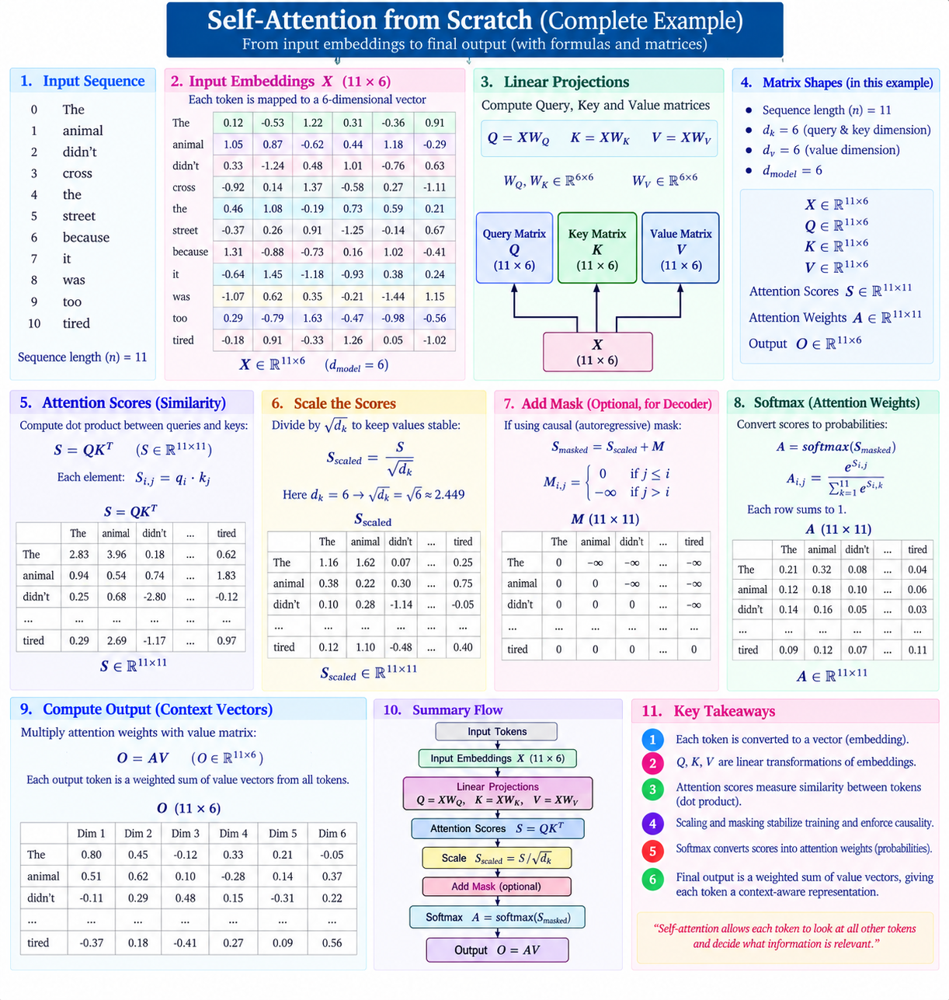

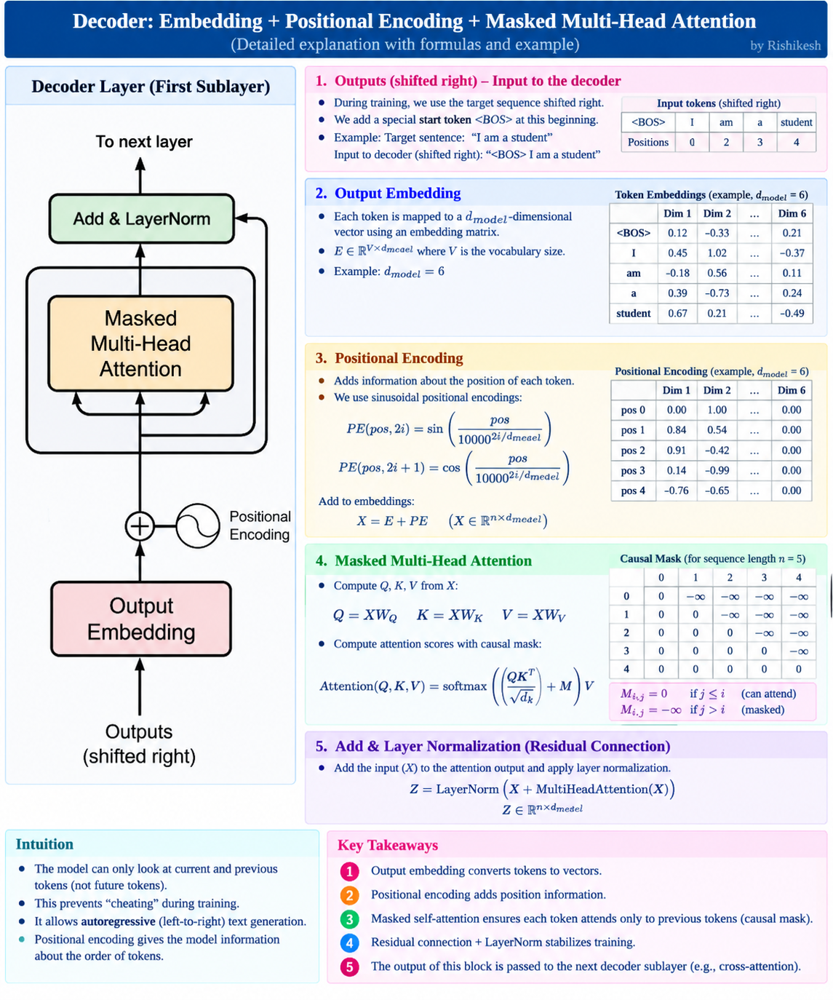

In [ ]:
mask = np.tril(np.ones((max_seq_len,max_seq_len))) ##  above digonal all zero
mask

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [ ]:
mask[mask==0]=-np.inf
mask[mask==1]=0


In [ ]:
mask

array([[  0., -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf],
       [  0.,   0., -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf],
       [  0.,   0.,   0., -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf],
       [  0.,   0.,   0.,   0., -inf, -inf, -inf, -inf, -inf, -inf, -inf],
       [  0.,   0.,   0.,   0.,   0., -inf, -inf, -inf, -inf, -inf, -inf],
       [  0.,   0.,   0.,   0.,   0.,   0., -inf, -inf, -inf, -inf, -inf],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0., -inf, -inf, -inf, -inf],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., -inf, -inf, -inf],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., -inf, -inf],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., -inf],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]])

In [ ]:
scaled_attn

array([[ 1.01485473,  0.40081127, -0.32576308, -0.11630215,  0.86889683,
        -0.21397825, -0.11155061, -1.23197604,  0.17060063, -0.71330741,
        -1.44818175],
       [ 0.11436594, -0.27293241,  0.42293989, -0.51195594, -0.15992887,
        -0.97320323, -0.58470996,  0.93814724, -0.462251  , -1.01523213,
         0.94871999],
       [-0.99170805, -0.83946169,  0.82746458,  0.77997461, -0.6662214 ,
         0.26199611, -1.6161426 ,  1.22392371, -1.26640062,  1.71062908,
         2.1588191 ],
       [ 0.01332896,  0.10731475, -0.15068712, -0.28487063, -0.66118996,
        -0.20987344,  1.41908331, -0.10021466,  1.19312242, -1.46391183,
         0.70622439],
       [ 0.11373592, -0.36906475,  0.88548773,  0.51627507, -0.64764392,
        -0.53468875, -1.17612409, -0.80333339, -0.80007562, -1.58272898,
         1.84033777],
       [ 0.09075244, -0.18836745, -0.0806695 ,  0.52249265, -0.05032984,
         0.28330427,  0.11782845, -0.17866653,  0.82193514,  0.50191403,
         0.685

In [ ]:
mask_scaled = scaled_attn + mask

In [ ]:
mask_scaled

array([[ 1.01485473,        -inf,        -inf,        -inf,        -inf,
               -inf,        -inf,        -inf,        -inf,        -inf,
               -inf],
       [ 0.11436594, -0.27293241,        -inf,        -inf,        -inf,
               -inf,        -inf,        -inf,        -inf,        -inf,
               -inf],
       [-0.99170805, -0.83946169,  0.82746458,        -inf,        -inf,
               -inf,        -inf,        -inf,        -inf,        -inf,
               -inf],
       [ 0.01332896,  0.10731475, -0.15068712, -0.28487063,        -inf,
               -inf,        -inf,        -inf,        -inf,        -inf,
               -inf],
       [ 0.11373592, -0.36906475,  0.88548773,  0.51627507, -0.64764392,
               -inf,        -inf,        -inf,        -inf,        -inf,
               -inf],
       [ 0.09075244, -0.18836745, -0.0806695 ,  0.52249265, -0.05032984,
         0.28330427,        -inf,        -inf,        -inf,        -inf,
              

In [ ]:
mask_softmax_attn = softmax(mask_scaled)
mask_softmax_attn

array([[1.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.59563216, 0.40436784, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.12003071, 0.13976941, 0.74019988, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.27104489, 0.29775478, 0.23004349, 0.20115684, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.1741176 , 0.10743975, 0.37671266, 0.26041332, 0.08131667,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.16078185, 0.1216233 , 0.13545325, 0.2475936 , 0.13962583,
        0.19492216, 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.10079521, 0.10512377, 0.11025647, 0.1148955 , 0.

In [ ]:
self_masked_attn =  np.matmul(mask_softmax_attn,v)

In [ ]:
self_masked_attn

array([[-0.471411  , -0.24062049,  2.71596978,  0.56525702,  1.05567153,
         0.96179702],
       [-1.43276517,  0.16830743,  0.97040876,  0.2629521 ,  0.36820314,
         0.58674579],
       [ 0.80757164,  0.64803976,  0.24570781,  0.31101506,  0.00763705,
        -0.1556979 ],
       [-0.25377631,  0.49346215,  0.36359877,  0.27441691, -0.01667514,
         0.48076613],
       [ 0.63433071,  0.31372301,  0.49963109,  0.35312177, -0.09923098,
         0.38512237],
       [ 0.00897726,  0.05523387,  0.7384446 ,  0.25395272, -0.07962575,
         0.29359167],
       [-0.27481224, -1.05493015,  0.53503886,  0.23415803, -0.40585051,
         0.00857021],
       [ 0.15013959,  0.12318846,  0.58136791,  0.17827704, -0.0424326 ,
         0.11190067],
       [-0.33810968, -0.56449292,  1.49314831,  0.33201912,  0.38770423,
         0.37695839],
       [ 0.5821342 ,  0.0280389 ,  0.43375032, -0.09487826, -0.09677575,
         0.04320313],
       [ 0.65798462, -0.20182513,  0.30450076,  0.